## Regression with Categorical Outcome Variable: NBA Data Set

In [11]:
#Import Data
NBA = pd.read_csv("NBA_Games2.csv")

In [12]:
NBA.describe()

,TEAM_ID,YEAR_FOUNDED,SEASON_ID,GAME_ID,MIN,PTS,FGM,FGA,FG_PCT,FG3M,...,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PLUS_MINUS,WIN
count,1.841400e+04,18414.000000,18414.000000,1.841400e+04,18414.000000,18414.000000,18414.000000,18414.000000,18414.000000,18414.000000,...,18414.000000,18414.000000,18414.000000,18414.000000,18414.000000,18414.000000,18414.000000,18414.000000,18414.000000,18414.000000
mean,1.610613e+09,1969.507929,22651.297708,1.210492e+08,239.069675,102.415608,37.930868,83.941186,0.452499,9.032801,...,10.398990,32.815032,43.214022,22.078799,7.788856,4.818236,13.964972,20.734984,0.044032,0.499946
std,8.669887e+00,16.503744,5526.812346,3.702010e+08,12.565379,13.656739,5.664956,8.371939,0.056436,3.721998,...,3.821974,5.592956,6.726882,5.477586,2.967932,2.528914,4.028064,4.593854,13.962254,0.500014
min,1.610613e+09,1946.000000,12013.000000,1.130000e+07,170.000000,47.000000,15.000000,46.000000,0.217000,0.000000,...,0.000000,11.000000,17.000000,2.000000,0.000000,0.000000,2.000000,7.000000,-61.000000,0.000000
25%,1.610613e+09,1949.000000,22014.000000,2.140027e+07,239.000000,93.000000,34.000000,79.000000,0.414000,6.000000,...,8.000000,29.000000,39.000000,18.000000,6.000000,3.000000,11.000000,18.000000,-9.000000,0.000000
50%,1.610613e+09,1970.000000,22015.000000,2.160016e+07,240.000000,102.000000,38.000000,84.000000,0.452000,9.000000,...,10.000000,33.000000,43.000000,22.000000,8.000000,5.000000,14.000000,20.000000,0.000000,0.000000
75%,1.610613e+09,1980.000000,22017.000000,2.180008e+07,241.000000,112.000000,42.000000,89.000000,0.489000,11.000000,...,13.000000,37.000000,48.000000,26.000000,10.000000,6.000000,16.000000,24.000000,9.000000,1.000000
max,1.610613e+09,2002.000000,42018.000000,1.621900e+09,341.000000,168.000000,61.000000,129.000000,0.684000,28.000000,...,38.000000,56.000000,81.000000,47.000000,23.000000,19.000000,35.000000,45.000000,62.000000,1.000000


In [13]:
NBA_2017=NBA[(NBA.SEASON_ID==22017) & (NBA.GAME_ID<1000000000)]
NBA_2017=NBA_2017.reset_index()
NBA_2017.describe()

,index,TEAM_ID,YEAR_FOUNDED,SEASON_ID,GAME_ID,MIN,PTS,FGM,FGA,FG_PCT,...,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PLUS_MINUS,WIN
count,2378.000000,2.378000e+03,2378.000000,2378.0,2.378000e+03,2378.000000,2378.00000,2378.000000,2378.000000,2378.000000,...,2378.000000,2378.000000,2378.000000,2378.000000,2378.000000,2378.000000,2378.000000,2378.000000,2378.000000,2378.000000
mean,9191.913793,1.610613e+09,1969.689655,22017.0,2.170061e+07,241.515980,106.24180,39.584945,86.082002,0.460732,...,9.696384,33.806981,43.503364,23.267872,7.718671,4.824643,13.660219,19.848192,0.006056,0.499579
std,5364.159674,8.743745e+00,16.701857,0.0,3.551609e+02,6.644589,12.08409,5.118262,6.856023,0.054889,...,3.629496,5.323937,6.362109,5.223099,2.920399,2.520916,3.721898,4.226855,13.839161,0.500105
min,101.000000,1.610613e+09,1946.000000,22017.0,2.170000e+07,237.000000,69.00000,22.000000,66.000000,0.282000,...,0.000000,18.000000,22.000000,9.000000,0.000000,0.000000,3.000000,8.000000,-61.000000,0.000000
25%,4569.250000,1.610613e+09,1949.000000,22017.0,2.170031e+07,240.000000,98.00000,36.000000,81.000000,0.423000,...,7.000000,30.000000,39.000000,20.000000,6.000000,3.000000,11.000000,17.000000,-9.000000,0.000000
50%,9302.500000,1.610613e+09,1970.000000,22017.0,2.170062e+07,240.000000,106.00000,39.000000,86.000000,0.460000,...,9.000000,34.000000,43.000000,23.000000,8.000000,5.000000,14.000000,20.000000,-1.000000,0.000000
75%,13615.750000,1.610613e+09,1980.000000,22017.0,2.170092e+07,241.000000,114.00000,43.000000,91.000000,0.495000,...,12.000000,37.000000,48.000000,27.000000,10.000000,6.000000,16.000000,23.000000,9.000000,1.000000
max,18110.000000,1.610613e+09,2002.000000,22017.0,2.170123e+07,317.000000,149.00000,58.000000,114.000000,0.667000,...,23.000000,56.000000,68.000000,46.000000,17.000000,16.000000,29.000000,42.000000,61.000000,1.000000


In [14]:
NBA_2017.columns

Index(['index', 'CITY', 'TEAM_NAME', 'TEAM_ID', 'NICKNAME', 'STATE',
       'YEAR_FOUNDED', 'SEASON_ID', 'TEAM_ABBREVIATION', 'GAME_ID',
       'GAME_DATE', 'MATCHUP', 'WL', 'MIN', 'PTS', 'FGM', 'FGA', 'FG_PCT',
       'FG3M', 'FG3A', 'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB', 'DREB',
       'REB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PLUS_MINUS', 'WIN'],
      dtype='object')

In [15]:
NBA_2017['year']=pd.DatetimeIndex(NBA_2017['GAME_DATE']).year
(NBA_2017[NBA_2017.year==2018].TEAM_ID.count())/2378

np.float64(0.5571909167367536)

In [16]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
NBA_2017.head(150)

,index,CITY,TEAM_NAME,TEAM_ID,NICKNAME,STATE,YEAR_FOUNDED,SEASON_ID,TEAM_ABBREVIATION,GAME_ID,GAME_DATE,MATCHUP,WL,MIN,PTS,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PLUS_MINUS,WIN,year
0,101,Atlanta,Atlanta Hawks,1610612737,Hawks,Atlanta,1949,22017,ATL,21701214,2018-04-10,ATL vs. PHI,L,240,113,41,98,0.418,13,37,0.351,18,26,0.692,8,31,39,27,10,3,10,24,-8.0,0,2018
1,102,Atlanta,Atlanta Hawks,1610612737,Hawks,Atlanta,1949,22017,ATL,21701202,2018-04-08,ATL @ BOS,W,239,112,43,86,0.500,15,35,0.429,11,14,0.786,5,32,37,23,7,4,13,19,6.0,1,2018
2,103,Atlanta,Atlanta Hawks,1610612737,Hawks,Atlanta,1949,22017,ATL,21701184,2018-04-06,ATL @ WAS,W,239,103,38,79,0.481,11,33,0.333,16,23,0.696,7,43,50,24,5,5,18,22,6.0,1,2018
3,104,Atlanta,Atlanta Hawks,1610612737,Hawks,Atlanta,1949,22017,ATL,21701172,2018-04-04,ATL vs. MIA,L,239,86,33,90,0.367,9,30,0.300,11,17,0.647,10,38,48,20,5,6,15,16,-29.0,0,2018
4,105,Atlanta,Atlanta Hawks,1610612737,Hawks,Atlanta,1949,22017,ATL,21701158,2018-04-03,ATL @ MIA,L,240,98,37,88,0.420,13,33,0.394,11,15,0.733,12,37,49,24,10,1,15,15,-3.0,0,2018
5,106,Atlanta,Atlanta Hawks,1610612737,Hawks,Atlanta,1949,22017,ATL,21701147,2018-04-01,ATL vs. ORL,W,241,94,41,85,0.482,11,36,0.306,1,1,1.000,5,47,52,33,0,3,14,15,6.0,1,2018
6,107,Atlanta,Atlanta Hawks,1610612737,Hawks,Atlanta,1949,22017,ATL,21701130,2018-03-30,ATL vs. PHI,L,239,91,36,101,0.356,9,39,0.231,10,15,0.667,15,44,59,24,9,4,16,14,-10.0,0,2018
7,108,Atlanta,Atlanta Hawks,1610612737,Hawks,Atlanta,1949,22017,ATL,21701120,2018-03-28,ATL @ MIN,L,239,114,41,77,0.532,13,27,0.481,19,23,0.826,4,33,37,26,10,2,19,22,-6.0,0,2018
8,109,Atlanta,Atlanta Hawks,1610612737,Hawks,Atlanta,1949,22017,ATL,21701101,2018-03-25,ATL @ HOU,L,239,99,39,88,0.443,11,40,0.275,10,11,0.909,7,38,45,18,5,2,13,14,-19.0,0,2018
9,110,Atlanta,Atlanta Hawks,1610612737,Hawks,Atlanta,1949,22017,ATL,21701087,2018-03-23,ATL @ GSW,L,241,94,37,84,0.440,11,32,0.344,9,20,0.450,5,39,44,24,5,5,11,14,-12.0,0,2018


In [17]:
NBA_2017=NBA_2017[['TEAM_NAME','TEAM_ID','TEAM_ABBREVIATION','GAME_ID','MATCHUP','PTS','PLUS_MINUS','WIN','year']]
NBA_2017

,TEAM_NAME,TEAM_ID,TEAM_ABBREVIATION,GAME_ID,MATCHUP,PTS,PLUS_MINUS,WIN,year
0,Atlanta Hawks,1610612737,ATL,21701214,ATL vs. PHI,113,-8.0,0,2018
1,Atlanta Hawks,1610612737,ATL,21701202,ATL @ BOS,112,6.0,1,2018
2,Atlanta Hawks,1610612737,ATL,21701184,ATL @ WAS,103,6.0,1,2018
3,Atlanta Hawks,1610612737,ATL,21701172,ATL vs. MIA,86,-29.0,0,2018
4,Atlanta Hawks,1610612737,ATL,21701158,ATL @ MIA,98,-3.0,0,2018
5,Atlanta Hawks,1610612737,ATL,21701147,ATL vs. ORL,94,6.0,1,2018
6,Atlanta Hawks,1610612737,ATL,21701130,ATL vs. PHI,91,-10.0,0,2018
7,Atlanta Hawks,1610612737,ATL,21701120,ATL @ MIN,114,-6.0,0,2018
8,Atlanta Hawks,1610612737,ATL,21701101,ATL @ HOU,99,-19.0,0,2018
9,Atlanta Hawks,1610612737,ATL,21701087,ATL @ GSW,94,-12.0,0,2018


In [18]:
NBA_2017['home']=np.where(NBA_2017.MATCHUP.str.contains(".vs"),1,0)
NBA_2017

,TEAM_NAME,TEAM_ID,TEAM_ABBREVIATION,GAME_ID,MATCHUP,PTS,PLUS_MINUS,WIN,year,home
0,Atlanta Hawks,1610612737,ATL,21701214,ATL vs. PHI,113,-8.0,0,2018,1
1,Atlanta Hawks,1610612737,ATL,21701202,ATL @ BOS,112,6.0,1,2018,0
2,Atlanta Hawks,1610612737,ATL,21701184,ATL @ WAS,103,6.0,1,2018,0
3,Atlanta Hawks,1610612737,ATL,21701172,ATL vs. MIA,86,-29.0,0,2018,1
4,Atlanta Hawks,1610612737,ATL,21701158,ATL @ MIA,98,-3.0,0,2018,0
5,Atlanta Hawks,1610612737,ATL,21701147,ATL vs. ORL,94,6.0,1,2018,1
6,Atlanta Hawks,1610612737,ATL,21701130,ATL vs. PHI,91,-10.0,0,2018,1
7,Atlanta Hawks,1610612737,ATL,21701120,ATL @ MIN,114,-6.0,0,2018,0
8,Atlanta Hawks,1610612737,ATL,21701101,ATL @ HOU,99,-19.0,0,2018,0
9,Atlanta Hawks,1610612737,ATL,21701087,ATL @ GSW,94,-12.0,0,2018,0


In [19]:
# Just checking if each match is listed twice
#NBA_2017[NBA_2017.CITY=='Boston']

In [20]:
NBA_2017['pts_for']=NBA_2017['PTS']
NBA_2017['pts_against']=NBA_2017['PTS']-NBA_2017['PLUS_MINUS']
NBA_2017

,TEAM_NAME,TEAM_ID,TEAM_ABBREVIATION,GAME_ID,MATCHUP,PTS,PLUS_MINUS,WIN,year,home,pts_for,pts_against
0,Atlanta Hawks,1610612737,ATL,21701214,ATL vs. PHI,113,-8.0,0,2018,1,113,121.0
1,Atlanta Hawks,1610612737,ATL,21701202,ATL @ BOS,112,6.0,1,2018,0,112,106.0
2,Atlanta Hawks,1610612737,ATL,21701184,ATL @ WAS,103,6.0,1,2018,0,103,97.0
3,Atlanta Hawks,1610612737,ATL,21701172,ATL vs. MIA,86,-29.0,0,2018,1,86,115.0
4,Atlanta Hawks,1610612737,ATL,21701158,ATL @ MIA,98,-3.0,0,2018,0,98,101.0
5,Atlanta Hawks,1610612737,ATL,21701147,ATL vs. ORL,94,6.0,1,2018,1,94,88.0
6,Atlanta Hawks,1610612737,ATL,21701130,ATL vs. PHI,91,-10.0,0,2018,1,91,101.0
7,Atlanta Hawks,1610612737,ATL,21701120,ATL @ MIN,114,-6.0,0,2018,0,114,120.0
8,Atlanta Hawks,1610612737,ATL,21701101,ATL @ HOU,99,-19.0,0,2018,0,99,118.0
9,Atlanta Hawks,1610612737,ATL,21701087,ATL @ GSW,94,-12.0,0,2018,0,94,106.0


In [22]:
NBA_2017 = NBA_2017.sort_values(by ='GAME_ID')

#2) Calculate cumulative GF and GA for each team
NBA_2017['cumGF'] = NBA_2017.groupby(['TEAM_ID'])['pts_for'].cumsum()
NBA_2017['cumGA'] = NBA_2017.groupby(['TEAM_ID'])['pts_against'].cumsum()

display(NBA_2017)

,TEAM_NAME,TEAM_ID,TEAM_ABBREVIATION,GAME_ID,MATCHUP,PTS,PLUS_MINUS,WIN,year,home,pts_for,pts_against,cumGF,cumGA
245,Cleveland Cavaliers,1610612739,CLE,21700001,CLE vs. BOS,102,3.0,1,2017,1,102,99.0,102,99.0
163,Boston Celtics,1610612738,BOS,21700001,BOS @ CLE,99,-3.0,0,2017,0,99,102.0,99,102.0
737,Houston Rockets,1610612745,HOU,21700002,HOU @ GSW,122,1.0,1,2017,0,122,121.0,122,121.0
655,Golden State Warriors,1610612744,GSW,21700002,GSW vs. HOU,121,-1.0,0,2017,1,121,122.0,121,122.0
2377,Charlotte Hornets,1610612766,CHA,21700003,CHA @ DET,90,-12.0,0,2017,0,90,102.0,90,102.0
2295,Detroit Pistons,1610612765,DET,21700003,DET vs. CHA,102,12.0,1,2017,1,102,90.0,102,90.0
1393,Indiana Pacers,1610612754,IND,21700004,IND vs. BKN,140,9.0,1,2017,1,140,131.0,140,131.0
1147,Brooklyn Nets,1610612751,BKN,21700004,BKN @ IND,131,-9.0,0,2017,0,131,140.0,131,140.0
901,Miami Heat,1610612748,MIA,21700005,MIA @ ORL,109,-7.0,0,2017,0,109,116.0,109,116.0
1311,Orlando Magic,1610612753,ORL,21700005,ORL vs. MIA,116,7.0,1,2017,1,116,109.0,116,109.0


In [23]:
#Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [24]:
NBA_2017['pyth_wpct'] = (NBA_2017['cumGF']**2)/(NBA_2017['cumGF']**2 +NBA_2017['cumGA']**2)
display(NBA_2017)

,TEAM_NAME,TEAM_ID,TEAM_ABBREVIATION,GAME_ID,MATCHUP,PTS,PLUS_MINUS,WIN,year,home,pts_for,pts_against,cumGF,cumGA,pyth_wpct
245,Cleveland Cavaliers,1610612739,CLE,21700001,CLE vs. BOS,102,3.0,1,2017,1,102,99.0,102,99.0,0.514922
163,Boston Celtics,1610612738,BOS,21700001,BOS @ CLE,99,-3.0,0,2017,0,99,102.0,99,102.0,0.485078
737,Houston Rockets,1610612745,HOU,21700002,HOU @ GSW,122,1.0,1,2017,0,122,121.0,122,121.0,0.504115
655,Golden State Warriors,1610612744,GSW,21700002,GSW vs. HOU,121,-1.0,0,2017,1,121,122.0,121,122.0,0.495885
2377,Charlotte Hornets,1610612766,CHA,21700003,CHA @ DET,90,-12.0,0,2017,0,90,102.0,90,102.0,0.437743
2295,Detroit Pistons,1610612765,DET,21700003,DET vs. CHA,102,12.0,1,2017,1,102,90.0,102,90.0,0.562257
1393,Indiana Pacers,1610612754,IND,21700004,IND vs. BKN,140,9.0,1,2017,1,140,131.0,140,131.0,0.533174
1147,Brooklyn Nets,1610612751,BKN,21700004,BKN @ IND,131,-9.0,0,2017,0,131,140.0,131,140.0,0.466826
901,Miami Heat,1610612748,MIA,21700005,MIA @ ORL,109,-7.0,0,2017,0,109,116.0,109,116.0,0.468919
1311,Orlando Magic,1610612753,ORL,21700005,ORL vs. MIA,116,7.0,1,2017,1,116,109.0,116,109.0,0.531081


In [25]:
NBA_2017.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2378 entries, 245 to 1640
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   TEAM_NAME          2378 non-null   object 
 1   TEAM_ID            2378 non-null   int64  
 2   TEAM_ABBREVIATION  2378 non-null   object 
 3   GAME_ID            2378 non-null   int64  
 4   MATCHUP            2378 non-null   object 
 5   PTS                2378 non-null   int64  
 6   PLUS_MINUS         2378 non-null   float64
 7   WIN                2378 non-null   int64  
 8   year               2378 non-null   int32  
 9   home               2378 non-null   int64  
 10  pts_for            2378 non-null   int64  
 11  pts_against        2378 non-null   float64
 12  cumGF              2378 non-null   int64  
 13  cumGA              2378 non-null   float64
 14  pyth_wpct          2378 non-null   float64
dtypes: float64(4), int32(1), int64(7), object(3)
memory usage: 288.0+ KB


In [26]:
NBA_2017['GAME_ID'].nunique()

1230

In [27]:
NBA_2017_1st =  NBA_2017[NBA_2017.GAME_ID <= 21700615].copy()
display(NBA_2017_1st)

,TEAM_NAME,TEAM_ID,TEAM_ABBREVIATION,GAME_ID,MATCHUP,PTS,PLUS_MINUS,WIN,year,home,pts_for,pts_against,cumGF,cumGA,pyth_wpct
245,Cleveland Cavaliers,1610612739,CLE,21700001,CLE vs. BOS,102,3.0,1,2017,1,102,99.0,102,99.0,0.514922
163,Boston Celtics,1610612738,BOS,21700001,BOS @ CLE,99,-3.0,0,2017,0,99,102.0,99,102.0,0.485078
737,Houston Rockets,1610612745,HOU,21700002,HOU @ GSW,122,1.0,1,2017,0,122,121.0,122,121.0,0.504115
655,Golden State Warriors,1610612744,GSW,21700002,GSW vs. HOU,121,-1.0,0,2017,1,121,122.0,121,122.0,0.495885
2377,Charlotte Hornets,1610612766,CHA,21700003,CHA @ DET,90,-12.0,0,2017,0,90,102.0,90,102.0,0.437743
2295,Detroit Pistons,1610612765,DET,21700003,DET vs. CHA,102,12.0,1,2017,1,102,90.0,102,90.0,0.562257
1393,Indiana Pacers,1610612754,IND,21700004,IND vs. BKN,140,9.0,1,2017,1,140,131.0,140,131.0,0.533174
1147,Brooklyn Nets,1610612751,BKN,21700004,BKN @ IND,131,-9.0,0,2017,0,131,140.0,131,140.0,0.466826
901,Miami Heat,1610612748,MIA,21700005,MIA @ ORL,109,-7.0,0,2017,0,109,116.0,109,116.0,0.468919
1311,Orlando Magic,1610612753,ORL,21700005,ORL vs. MIA,116,7.0,1,2017,1,116,109.0,116,109.0,0.531081


In [28]:
NBA_2017_1st[NBA_2017_1st['TEAM_NAME']=='Atlanta Hawks'].count()

TEAM_NAME            41
TEAM_ID              41
TEAM_ABBREVIATION    41
GAME_ID              41
MATCHUP              41
PTS                  41
PLUS_MINUS           41
WIN                  41
year                 41
home                 41
pts_for              41
pts_against          41
cumGF                41
cumGA                41
pyth_wpct            41
dtype: int64

In [29]:
NBA_2017_1st[NBA_2017_1st['TEAM_NAME']=='Chicago Bulls'].count()

TEAM_NAME            42
TEAM_ID              42
TEAM_ABBREVIATION    42
GAME_ID              42
MATCHUP              42
PTS                  42
PLUS_MINUS           42
WIN                  42
year                 42
home                 42
pts_for              42
pts_against          42
cumGF                42
cumGA                42
pyth_wpct            42
dtype: int64

In [30]:
NBA_2017_2nd =  NBA_2017[NBA_2017.GAME_ID > 21700615].copy()
display(NBA_2017_2nd)

,TEAM_NAME,TEAM_ID,TEAM_ABBREVIATION,GAME_ID,MATCHUP,PTS,PLUS_MINUS,WIN,year,home,pts_for,pts_against,cumGF,cumGA,pyth_wpct
1681,Sacramento Kings,1610612758,SAC,21700616,SAC vs. LAC,115,-6.0,0,2018,1,115,121.0,4009,4360.0,0.458133
779,Los Angeles Lakers,1610612747,LAL,21700617,LAL vs. SAS,93,12.0,1,2018,1,93,81.0,4366,4526.0,0.482012
1761,San Antonio Spurs,1610612759,SAS,21700617,SAS @ LAL,81,-12.0,0,2018,0,81,93.0,4350,4227.0,0.514338
2008,Utah Jazz,1610612762,UTA,21700618,UTA @ CHA,88,-11.0,0,2018,0,88,99.0,4231,4263.0,0.496233
2338,Charlotte Hornets,1610612766,CHA,21700618,CHA vs. UTA,99,11.0,1,2018,1,99,88.0,4201,4228.0,0.496797
204,Cleveland Cavaliers,1610612739,CLE,21700619,CLE @ IND,95,-2.0,0,2018,0,95,97.0,4601,4557.0,0.504804
1352,Indiana Pacers,1610612754,IND,21700619,IND vs. CLE,97,2.0,1,2018,1,97,95.0,4496,4464.0,0.503571
2172,Washington Wizards,1610612764,WAS,21700620,WAS vs. ORL,125,6.0,1,2018,1,125,119.0,4487,4390.0,0.510926
1269,Orlando Magic,1610612753,ORL,21700620,ORL @ WAS,119,-6.0,0,2018,0,119,125.0,4525,4793.0,0.471262
40,Atlanta Hawks,1610612737,ATL,21700621,ATL vs. BKN,105,-5.0,0,2018,1,105,110.0,4367,4553.6,0.479091


In [31]:
NBA_2017.dtypes
# Win is int so not draws

TEAM_NAME             object
TEAM_ID                int64
TEAM_ABBREVIATION     object
GAME_ID                int64
MATCHUP               object
PTS                    int64
PLUS_MINUS           float64
WIN                    int64
year                   int32
home                   int64
pts_for                int64
pts_against          float64
cumGF                  int64
cumGA                float64
pyth_wpct            float64
dtype: object

In [32]:
###Run LPM (Linear Probability Model)
reg1 = smf.ols(formula = 'WIN ~ pyth_wpct', data = NBA_2017).fit()
print(reg1.summary())

                            OLS Regression Results                            
Dep. Variable:                    WIN   R-squared:                       0.102
Model:                            OLS   Adj. R-squared:                  0.101
Method:                 Least Squares   F-statistic:                     268.7
Date:                Fri, 18 Sep 2026   Prob (F-statistic):           2.65e-57
Time:                        17:53:54   Log-Likelihood:                -1598.5
No. Observations:                2378   AIC:                             3201.
Df Residuals:                    2376   BIC:                             3213.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.6461      0.192    -13.772      0.0

/Users/LaraPiers/Projects/nba-win-prediction-pythagorean/.venv/lib/python3.9/site-packages/numpy/linalg/_linalg.py:3220: RuntimeWarning: divide by zero encountered in matmul
  return _core_matmul(x1, x2)
/Users/LaraPiers/Projects/nba-win-prediction-pythagorean/.venv/lib/python3.9/site-packages/numpy/linalg/_linalg.py:3220: RuntimeWarning: overflow encountered in matmul
  return _core_matmul(x1, x2)
/Users/LaraPiers/Projects/nba-win-prediction-pythagorean/.venv/lib/python3.9/site-packages/numpy/linalg/_linalg.py:3220: RuntimeWarning: invalid value encountered in matmul
  return _core_matmul(x1, x2)


Text(0.5, 1.0, 'Pythagorean Win % and Win-Record')

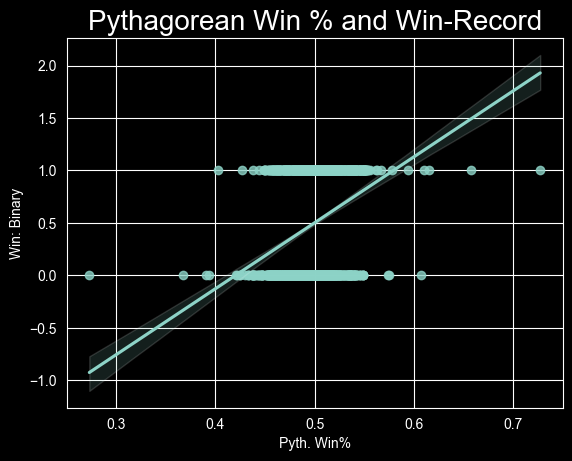

In [33]:
import seaborn as sns
sns.regplot(x = 'pyth_wpct', y ='WIN', data = NBA_2017)
plt.xlabel('Pyth. Win%')
plt.ylabel('Win: Binary')
plt.title("Pythagorean Win % and Win-Record", fontsize=20)

In [35]:
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [36]:
Win_Pyth = 'WIN~pyth_wpct'
model = smf.glm(formula = Win_Pyth, data = NBA_2017, family=sm.families.Binomial())
result = model.fit()
print(result.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                    WIN   No. Observations:                 2378
Model:                            GLM   Df Residuals:                     2376
Model Family:                Binomial   Df Model:                            1
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1513.6
Date:                Fri, 18 Sep 2026   Deviance:                       3027.3
Time:                        17:55:34   Pearson chi2:                 2.41e+03
No. Iterations:                     3   Pseudo R-squ. (CS):             0.1071
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -15.2824      1.027    -14.877      0.0

In [37]:
print("Coefficients")
print(result.params)
print("p-Values")
print(result.pvalues)
print("Dependent variables")
print(result.model.endog_names)

Coefficients
Intercept   -15.282377
pyth_wpct    30.573898
dtype: float64
p-Values
Intercept    4.653314e-50
pyth_wpct    3.747873e-50
dtype: float64
Dependent variables
WIN


In [38]:
fittedProbs = result.predict()
print(fittedProbs[0:10])

[0.61320335 0.38896784 0.53255106 0.46972606 0.13023744 0.87079493
 0.73474326 0.2670428  0.27975124 0.72208759]


In [39]:
fittedWin = [1 if x > .5 else 0 for x in fittedProbs]
print(fittedWin[0:10])

[1, 0, 1, 0, 0, 1, 1, 0, 0, 1]


In [40]:
from sklearn.metrics import confusion_matrix, classification_report
confusion_matrix(NBA_2017['WIN'], fittedWin)

array([[742, 448],
       [389, 799]])

In [41]:
# Success rate
(742+799)/2378

0.6480235492010092

In [42]:
Win_Pyth_home = 'WIN~pyth_wpct+home'
model1 = smf.glm(formula = Win_Pyth_home, data = NBA_2017, family=sm.families.Binomial())
result1 = model1.fit()
print(result1.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                    WIN   No. Observations:                 2378
Model:                            GLM   Df Residuals:                     2375
Model Family:                Binomial   Df Model:                            2
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1481.6
Date:                Fri, 18 Sep 2026   Deviance:                       2963.2
Time:                        17:55:38   Pearson chi2:                 2.41e+03
No. Iterations:                     4   Pseudo R-squ. (CS):             0.1308
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -15.9054      1.049    -15.160      0.0

In [43]:
print("Coefficients")
print(result1.params)
print("p-Values")
print(result1.pvalues)
print("Dependent variables")
print(result1.model.endog_names)

Coefficients
Intercept   -15.905353
pyth_wpct    31.119647
home          0.700551
dtype: float64
p-Values
Intercept    6.514179e-52
pyth_wpct    3.003712e-50
home         2.156804e-15
dtype: float64
Dependent variables
WIN


In [44]:
fittedProbs1 = result1.predict()
print(fittedProbs1[0:10])

[0.69410681 0.30791206 0.44584633 0.55649738 0.09254577 0.90824823
 0.80017304 0.20134888 0.21202528 0.78955607]


In [45]:
fittedWin1 = [1 if x > .5 else 0 for x in fittedProbs1]
print(fittedWin1[0:10])

[1, 0, 0, 1, 0, 1, 1, 0, 0, 1]


In [46]:
confusion_matrix(NBA_2017['WIN'], fittedWin1)

array([[787, 403],
       [423, 765]])

In [47]:
# Success rate
(787+765)/2378

0.6526492851135408

In [48]:
####Forecasting

In [50]:
NBA2017_pre = NBA_2017_1st.groupby(['TEAM_ABBREVIATION'])[['WIN','pts_for','pts_against']].sum()


In [52]:
NBA2017_post = NBA_2017_2nd.groupby(['TEAM_ABBREVIATION'])[['WIN','pts_for','pts_against']].sum()

In [53]:
NBA_pre_GameNum = NBA_2017_1st.groupby(['TEAM_ABBREVIATION']).size().reset_index(name='game_count')
display(NBA_pre_GameNum[0:3])

,TEAM_ABBREVIATION,game_count
0,ATL,41
1,BKN,41
2,BOS,44


In [54]:
NBA2017_pre=pd.merge(NBA2017_pre, NBA_pre_GameNum, on=['TEAM_ABBREVIATION'])
NBA2017_pre.head()

,TEAM_ABBREVIATION,WIN,pts_for,pts_against,game_count
0,ATL,11,4262,4443.6,41
1,BKN,15,4342,4473.6,41
2,BOS,34,4532,4299.8,44
3,CHA,15,4102,4140.0,39
4,CHI,15,4295,4551.0,42


In [55]:
NBA2017_pre['win_pct_pre']=NBA2017_pre['WIN']/NBA2017_pre['game_count']
NBA2017_pre['pyth_wpct_pre']=NBA2017_pre['pts_for']**2/(NBA2017_pre['pts_for']**2+NBA2017_pre['pts_against']**2)

NBA2017_pre.head()

,TEAM_ABBREVIATION,WIN,pts_for,pts_against,game_count,win_pct_pre,pyth_wpct_pre
0,ATL,11,4262,4443.6,41,0.268293,0.479149
1,BKN,15,4342,4473.6,41,0.365854,0.485075
2,BOS,34,4532,4299.8,44,0.772727,0.526273
3,CHA,15,4102,4140.0,39,0.384615,0.495390
4,CHI,15,4295,4551.0,42,0.357143,0.471085


In [56]:
NBA2017_post['game_count']=NBA_2017_2nd.groupby(['TEAM_ABBREVIATION']).size()
NBA2017_post.reset_index(inplace=True)
NBA2017_post.head()

,TEAM_ABBREVIATION,WIN,pts_for,pts_against,game_count
0,ATL,13,4213,4478.0,41
1,BKN,13,4399,4580.0,41
2,BOS,21,3997,3934.8,38
3,CHA,21,4772,4713.0,43
4,CHI,12,4145,4466.0,40


In [57]:
NBA2017_post['win_pct_post']=NBA2017_post['WIN']/NBA2017_post['game_count']

NBA2017_post.head()

,TEAM_ABBREVIATION,WIN,pts_for,pts_against,game_count,win_pct_post
0,ATL,13,4213,4478.0,41,0.317073
1,BKN,13,4399,4580.0,41,0.317073
2,BOS,21,3997,3934.8,38,0.552632
3,CHA,21,4772,4713.0,43,0.488372
4,CHI,12,4145,4466.0,40,0.300000


In [58]:
NBA2017_pre.drop(['pts_for'], axis=1, inplace=True)
NBA2017_pre.drop(['pts_against'], axis=1, inplace=True)
NBA2017_pre.drop(['game_count'], axis=1, inplace=True)
NBA2017_pre.drop(['WIN'], axis=1, inplace=True)

NBA2017_pre.head()

,TEAM_ABBREVIATION,win_pct_pre,pyth_wpct_pre
0,ATL,0.268293,0.479149
1,BKN,0.365854,0.485075
2,BOS,0.772727,0.526273
3,CHA,0.384615,0.495390
4,CHI,0.357143,0.471085


In [60]:
NBA2017_pre.corr(numeric_only=True)

,win_pct_pre,pyth_wpct_pre
win_pct_pre,1.000000,0.911665
pyth_wpct_pre,0.911665,1.000000


In [61]:
NBA2017_post.drop(['pts_for'], axis=1, inplace=True)
NBA2017_post.drop(['pts_against'], axis=1, inplace=True)
NBA2017_post.drop(['game_count'], axis=1, inplace=True)
NBA2017_post.drop(['WIN'], axis=1, inplace=True)

NBA2017_post.head()

,TEAM_ABBREVIATION,win_pct_post
0,ATL,0.317073
1,BKN,0.317073
2,BOS,0.552632
3,CHA,0.488372
4,CHI,0.300000


In [62]:
NBA2017_post=pd.merge(NBA2017_post, NBA2017_pre, on=['TEAM_ABBREVIATION'])
NBA2017_post.head()

,TEAM_ABBREVIATION,win_pct_post,win_pct_pre,pyth_wpct_pre
0,ATL,0.317073,0.268293,0.479149
1,BKN,0.317073,0.365854,0.485075
2,BOS,0.552632,0.772727,0.526273
3,CHA,0.488372,0.384615,0.495390
4,CHI,0.300000,0.357143,0.471085


Text(0.5, 1.0, 'Correlation: Pre-win% vs Post-win%')

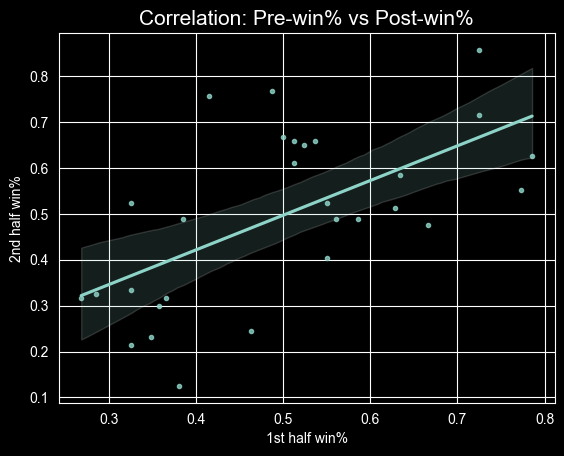

In [63]:
# Let's plot the variables and fit the model
sns.regplot(x='win_pct_pre', y='win_pct_post', data=NBA2017_post,  marker='.')
plt.xlabel('1st half win%')
plt.ylabel('2nd half win%')
plt.title("Correlation: Pre-win% vs Post-win%", fontsize=15)

In [64]:
WinPct_lm = smf.ols(formula = 'win_pct_post ~ win_pct_pre', data=NBA2017_post).fit()
WinPct_lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           win_pct_post   R-squared:                       0.363
Model:                            OLS   Adj. R-squared:                  0.340
Method:                 Least Squares   F-statistic:                     15.40
Date:                Fri, 18 Sep 2026   Prob (F-statistic):           0.000541
Time:                        17:57:18   Log-Likelihood:                 14.429
No. Observations:                  29   AIC:                            -24.86
Df Residuals:                      27   BIC:                            -22.12
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.1191      0.100      1.186      0.246      -0.087       0.325
win_pct_pre     0.7558      0.193      3.924      0.001       0.361       1.151
==============================================================================
Omnibus:                        0.868   Durbin-Watson:                   2.659
Prob(Omnibus):                  0.648   Jarque-Bera (JB):                0.904
Skew:                           0.316   Prob(JB):                        0.637
Kurtosis:                       2.409   Cond. No.                         8.53
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Text(0.5, 1.0, 'Correlation: Pre-Pyth.win% vs Post-win%')

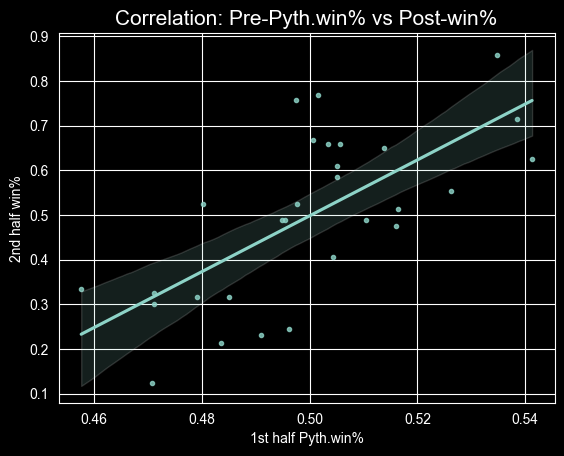

In [65]:
sns.regplot(x='pyth_wpct_pre', y='win_pct_post', data=NBA2017_post,  marker='.')
plt.xlabel('1st half Pyth.win%')
plt.ylabel('2nd half win%')
plt.title("Correlation: Pre-Pyth.win% vs Post-win%", fontsize=15)

In [66]:
PythWin_lm = smf.ols(formula = 'win_pct_post ~ pyth_wpct_pre', data=NBA2017_post).fit()
PythWin_lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           win_pct_post   R-squared:                       0.469
Model:                            OLS   Adj. R-squared:                  0.449
Method:                 Least Squares   F-statistic:                     23.86
Date:                Fri, 18 Sep 2026   Prob (F-statistic):           4.15e-05
Time:                        17:57:20   Log-Likelihood:                 17.068
No. Observations:                  29   AIC:                            -30.14
Df Residuals:                      27   BIC:                            -27.40
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        -2.6293      0.641     -4.105      0.000      -3.944      -1.315
pyth_wpct_pre     6.2544      1.280      4.885      0.000       3.627       8.881
==============================================================================
Omnibus:                        1.068   Durbin-Watson:                   2.695
Prob(Omnibus):                  0.586   Jarque-Bera (JB):                0.898
Skew:                           0.166   Prob(JB):                        0.638
Kurtosis:                       2.204   Cond. No.                         61.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [67]:
from statsmodels.iolib.summary2 import summary_col
info_dict={'R-squared' : lambda x: f"{x.rsquared:.2f}"}
Header = ['1','2']
Table_1 = summary_col([WinPct_lm, PythWin_lm,],\
                      regressor_order=['Intercept','Win%','Pyth.Win%'], model_names = Header, info_dict=info_dict)
print(Table_1)


                  1        2    
--------------------------------
Intercept      0.1191   -2.6293 
               (0.1004) (0.6405)
win_pct_pre    0.7558           
               (0.1926)         
pyth_wpct_pre           6.2544  
                        (1.2804)
R-squared      0.3632   0.4692  
R-squared Adj. 0.3396   0.4495  
R-squared      0.36     0.47    
Standard errors in parentheses.
